## Analyzing the Air bnb datasets for Boston

### Part of the first project for DataScience Nanodegree from Udacity

### Data Scientist: Rafael Mata M.

### Date Created: 15 October 2020
### Last updated: 31 October 2020

#### Import the libraries 

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
from sklearn import preprocessing

# if needed download stopwords and punkt

import nltk
#nltk.download('stopwords')
#nltk.download('punkt')

%matplotlib inline

### Read the datasets

In [19]:
boston_dir = '/Users/rafaelmata357/Udacity/Data Science Nanodegree/Projects/Airbnb/Boston/'
seattle_dir = '/Users/rafaelmata357/Udacity/Data Science Nanodegree/Projects/Airbnb/Seattle/'

#### Boston Datasets

In [20]:
boston_df_listings = pd.read_csv(boston_dir+'listings.csv')
boston_df_calendar = pd.read_csv(boston_dir+'calendar.csv')
boston_df_reviews = pd.read_csv(boston_dir+'reviews.csv')
print('Boston datasets read...')

Boston datasets read...


## DATA UNDERSTANDING

There is three datasets:
    
- listings: contains the list of airbnb's houses in the Boston and Seattle area
- calendar: the availabily of houses
- reviews: Reviews for the houses

The datasets can be found here

#### Datasets shapes

In [21]:
print('BOSTON datasets Shape')
print('Listings dataset: {}'.format(boston_df_listings.shape))
print('Calendar dataset: {}'.format(boston_df_calendar.shape))
print('Reviews dataset: {}'.format(boston_df_reviews.shape))

BOSTON datasets Shape
Listings dataset: (3585, 95)
Calendar dataset: (1308890, 4)
Reviews dataset: (68275, 6)


In [22]:
boston_df_reviews.head(5)

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,1178162,4724140,2013-05-21,4298113,Olivier,My stay at islam...
1,1178162,4869189,2013-05-29,6452964,Charlotte,Great location f...
2,1178162,5003196,2013-06-06,6449554,Sebastian,We really enjoye...
3,1178162,5150351,2013-06-15,2215611,Marine,The room was nic...
4,1178162,5171140,2013-06-16,6848427,Andrew,Great location. ...


In [23]:
boston_df_calendar.head(5)

,listing_id,date,available,price
0,12147973,2017-09-05,f,NaN
1,12147973,2017-09-04,f,NaN
2,12147973,2017-09-03,f,NaN
3,12147973,2017-09-02,f,NaN
4,12147973,2017-09-01,f,NaN


In [24]:
pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth', 20)
boston_df_listings.head(5)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,12147973,https://www.airb...,20160906204935,2016-09-07,Sunny Bungalow i...,"Cozy, sunny, fam...",The house has an...,"Cozy, sunny, fam...",none,Roslindale is qu...,NaN,The bus stop is ...,You will have ac...,NaN,Clean up and tre...,https://a2.musca...,https://a2.musca...,https://a2.musca...,https://a2.musca...,31303940,https://www.airb...,Virginia,2015-04-15,"Boston, Massachu...",We are country a...,NaN,NaN,NaN,f,https://a2.musca...,https://a2.musca...,Roslindale,1,1,"['email', 'phone...",t,f,"Birch Street, Bo...",Roslindale,Roslindale,NaN,Boston,MA,02131,Boston,"Boston, MA",US,United States,42.282619,-71.133068,t,House,Entire home/apt,4,1.5,2.0,3.0,Real Bed,"{TV,""Wireless In...",NaN,$250.00,NaN,NaN,NaN,$35.00,1,$0.00,2,1125,2 weeks ago,NaN,0,0,0,0,2016-09-06,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,NaN,NaN,f,moderate,f,f,1,NaN
1,3075044,https://www.airb...,20160906204935,2016-09-07,Charming room in...,Charming and qui...,Small but cozy a...,Charming and qui...,none,The room is in R...,If you don't hav...,Plenty of safe s...,Apt has one more...,"If I am at home,...",Pet friendly but...,https://a1.musca...,https://a1.musca...,https://a1.musca...,https://a1.musca...,2572247,https://www.airb...,Andrea,2012-06-07,"Boston, Massachu...",I live in Boston...,within an hour,100%,100%,f,https://a2.musca...,https://a2.musca...,Roslindale,1,1,"['email', 'phone...",t,t,Pinehurst Street...,Roslindale,Roslindale,NaN,Boston,MA,02131,Boston,"Boston, MA",US,United States,42.286241,-71.134374,t,Apartment,Private room,2,1.0,1.0,1.0,Real Bed,"{TV,Internet,""Wi...",NaN,$65.00,$400.00,NaN,$95.00,$10.00,0,$0.00,2,15,a week ago,NaN,26,54,84,359,2016-09-06,36,2014-06-01,2016-08-13,94.0,10.0,9.0,10.0,10.0,9.0,9.0,f,NaN,NaN,t,moderate,f,f,1,1.30
2,6976,https://www.airb...,20160906204935,2016-09-07,Mexican Folk Art...,Come stay with a...,Come stay with a...,Come stay with a...,none,The LOCATION: Ro...,I am in a scenic...,PUBLIC TRANSPORT...,I am living in t...,ABOUT ME: I'm a ...,I encourage you ...,https://a2.musca...,https://a2.musca...,https://a2.musca...,https://a2.musca...,16701,https://www.airb...,Phil,2009-05-11,"Boston, Massachu...",I am a middle-ag...,within a few hours,100%,88%,t,https://a2.musca...,https://a2.musca...,Roslindale,1,1,"['email', 'phone...",t,t,"Ardale St., Bost...",Roslindale,Roslindale,NaN,Boston,MA,02131,Boston,"Boston, MA",US,United States,42.292438,-71.135765,t,Apartment,Private room,2,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",""...",NaN,$65.00,$395.00,"$1,350.00",NaN,NaN,1,$20.00,3,45,5 days ago,NaN,19,46,61,319,2016-09-06,41,2009-07-

### Select the features from listings that are  going to be considered in the analysis

In [25]:
listings_features = ['id', 'neighborhood_overview', 'transit', 'host_response_rate', 'host_acceptance_rate', 'host_listings_count',
       'host_total_listings_count', 'host_is_superhost',
       'availability_30', 'availability_60', 'availability_90', 'availability_365',
                     'neighbourhood_cleansed', 'zipcode', 'latitude', 'longitude', 'property_type', 'room_type', 
                     'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities','price', 'guests_included', 
                     'extra_people', 'number_of_reviews', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness',
                     'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 
                     'cancellation_policy', 'reviews_per_month']

In [26]:
boston_df2_listings = boston_df_listings[listings_features].copy()


#### Nan values in the datasets

In [27]:
boston_nulls_listings = boston_df2_listings.isnull().sum()/boston_df_listings.shape[0]*100
boston_nulls_calendar = boston_df_calendar.isnull().sum()/boston_df_calendar.shape[0]*100
boston_nulls_reviews  = boston_df_reviews.isnull().sum()/boston_df_reviews.shape[0]*100


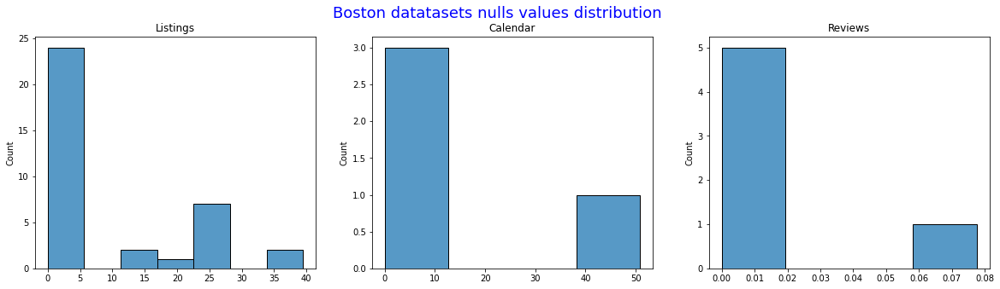

In [28]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20,5)) 
fig.suptitle('Boston datatasets nulls values distribution', fontsize=18, c='b')
#boston_nulls_listings.hist(ax=ax[0])
sns.histplot(data=boston_nulls_listings,x=boston_nulls_listings.values ,discrete=False,ax=ax[0])
sns.histplot(data=boston_nulls_calendar,x=boston_nulls_calendar.values ,discrete=False,ax=ax[1])
sns.histplot(data=boston_nulls_reviews,x=boston_nulls_reviews.values ,discrete=False,ax=ax[2])
ax[0].set_title('Listings')
ax[1].set_title('Calendar')
ax[2].set_title('Reviews');

### It looks that  the Listings datasets have the more columns with Nan values below will be process this Nan values

#### Columns with more than 20% Nan Values

In [29]:
print('BOSTON')
print('Listings dataset columns with more than 20% Nan values')
boston_df2_listings.columns[boston_nulls_listings >= 20]

BOSTON
Listings dataset columns with more than 20% Nan values


Index(['neighborhood_overview', 'transit', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'reviews_per_month'],
      dtype='object')

## Data Cleaning and preprocessing

### Convert date columns to year, month, week, dayofWeek

In [30]:
boston_df_calendar['Month'] = pd.to_datetime(boston_df_calendar['date']).dt.month_name() #strftime("%b")
boston_df_calendar['Year'] = pd.to_datetime(boston_df_calendar['date']).dt.year
boston_df_calendar['Day'] = pd.to_datetime(boston_df_calendar['date']).dt.day_name()

boston_df_calendar.drop(columns=['price'],inplace=True)

In [31]:
boston_df_calendar.available = boston_df_calendar.available.str.replace('t','1')
boston_df_calendar.available = boston_df_calendar.available.str.replace('f','0')
boston_df_calendar.available = boston_df_calendar.available.astype(int)

In [32]:
boston_df_reviews['Month'] = pd.to_datetime(boston_df_reviews['date']).dt.strftime("%b")
boston_df_reviews['year'] = pd.to_datetime(boston_df_reviews['date']).dt.year
boston_df_reviews['dayofweek'] = pd.to_datetime(boston_df_reviews['date']).dt.dayofweek

### Using the NLTK library, preprocessing the text columns to extract some features to include in the model

Based on [this](https://towardsdatascience.com/getting-started-with-text-analysis-in-python-ca13590eb4f7) article from **medium** to use the NLTK

In [379]:
# Function to preprocess the text columns a eliminate word stoppers and puntuantion 

import re
from nltk.stem import WordNetLemmatizer, PorterStemmer, SnowballStemmer

stop_words = set(stopwords.words('english'))

def preprocess(raw_text):
    
    #regular expression keeping only letters 
    letters_only_text = re.sub("[^a-zA-Z]", " ", raw_text)

    # convert to lower case and split into words -> convert string into list ( 'hello world' -> ['hello', 'world'])
    words = letters_only_text.lower().split()

    cleaned_words = []
    lemmatizer = PorterStemmer() #plug in here any other stemmer or lemmatiser you want to try out
    
    # remove stopwords
    for word in words:
        if word not in stop_words:
            cleaned_words.append(word)
    
    # stemm or lemmatise words
    stemmed_words = []
    for word in cleaned_words:
        word = lemmatizer.stem(word)   #dont forget to change stem to lemmatize if you are using a lemmatizer
        stemmed_words.append(word)
    
    # converting list back to string
    return " ".join(stemmed_words)

In [380]:
# Copy the text columns to analyze into a new dataframe


df = boston_df2_listings[['neighborhood_overview','transit','amenities']].copy()

## Convert to string this columns 
df['transit_str'] = df['transit'].astype(str)
df['amenities_str'] = df['amenities'].astype(str)
df['neighborhood_str'] = df['neighborhood_overview'].astype(str)

# Convert to tokens the columns

df['amenities_token'] = df['amenities_str'].apply(preprocess)
df['neighborhood_token'] = df['neighborhood_str'].apply(preprocess)
df['transit_token'] = df['transit_str'].apply(preprocess)



In [381]:
# Most commong words
print('Most amenities column common words')
from collections import Counter
Counter(" ".join(df["amenities_token"]).split()).most_common(10)


Most amenities column common words


[('internet', 5998),
 ('detector', 5353),
 ('tv', 4377),
 ('dryer', 4289),
 ('wireless', 4260),
 ('friendli', 3722),
 ('heat', 3384),
 ('kitchen', 3284),
 ('smoke', 3006),
 ('essenti', 2994)]

In [382]:
# Most commong words
print('Most transit column common words')
from collections import Counter
Counter(" ".join(df["transit_token"]).split()).most_common(10)

Most transit column common words


[('walk', 2416),
 ('minut', 2382),
 ('line', 2240),
 ('boston', 1766),
 ('station', 1691),
 ('nan', 1290),
 ('park', 1254),
 ('bu', 1191),
 ('stop', 1142),
 ('street', 1053)]

In [383]:
# Most commong words
print('Most neighborhood column common words')
from collections import Counter
Counter(" ".join(df["neighborhood_token"]).split()).most_common(10)

Most neighborhood column common words


[('boston', 2575),
 ('walk', 1593),
 ('neighborhood', 1544),
 ('restaur', 1471),
 ('nan', 1415),
 ('street', 1013),
 ('shop', 916),
 ('park', 896),
 ('locat', 778),
 ('minut', 765)]

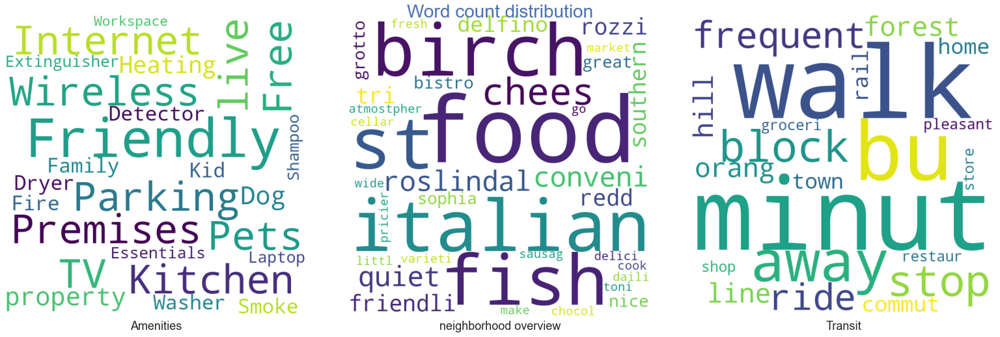

In [384]:
def word_cloud(column):

    all_words = '' 

    for arg in column: 
        tokens = arg.split()  
        all_words += " ".join(tokens)+" "
        wordcloud = WordCloud(width = 700, height = 700, background_color ='white', min_font_size = 8).generate(all_words) 
        
        return all_words, wordcloud
  
fig , ax = plt.subplots(nrows=1, ncols=3, figsize=(22,7)) 
fig.suptitle('Word count distribution', fontsize=28, c='b')                        

amenities_aw, amenities_wc =  word_cloud(df['amenities']) 
neighbor_aw, neighbor_wc =  word_cloud(df['neighborhood_token'])
transit_aw, transit_wc =  word_cloud(df['transit_token'])

ax[0].imshow(amenities_wc) 
#ax[0].axis("off")
ax[0].get_yaxis().set_ticks([])
ax[0].get_xaxis().set_ticks([])
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)
ax[0].spines['left'].set_visible(False)
ax[0].set_xlabel('Amenities',fontsize=18)
ax[1].imshow(neighbor_wc) 
ax[1].get_yaxis().set_ticks([])
ax[1].get_xaxis().set_ticks([])
ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)
ax[1].spines['left'].set_visible(False)
ax[1].set_xlabel('neighborhood overview',fontsize=18) 
ax[2].imshow(transit_wc) 
ax[2].get_yaxis().set_ticks([])
ax[2].get_xaxis().set_ticks([])
ax[2].spines['top'].set_visible(False)
ax[2].spines['right'].set_visible(False)
ax[2].spines['left'].set_visible(False)
ax[2].set_xlabel('Transit',fontsize=18) 
plt.tight_layout(pad = 0)

In [385]:
from nltk.util import ngrams
n_gram = 5
n_gram_dic = dict(Counter(ngrams(neighbor_aw.split(), n_gram)))

for i in n_gram_dic:
    if n_gram_dic[i] >= 1:
        print(i, n_gram_dic[i])

('roslindal', 'quiet', 'conveni', 'friendli', 'southern') 1
('quiet', 'conveni', 'friendli', 'southern', 'food') 1
('conveni', 'friendli', 'southern', 'food', 'tri') 1
('friendli', 'southern', 'food', 'tri', 'redd') 1
('southern', 'food', 'tri', 'redd', 'rozzi') 1
('food', 'tri', 'redd', 'rozzi', 'italian') 1
('tri', 'redd', 'rozzi', 'italian', 'delfino') 1
('redd', 'rozzi', 'italian', 'delfino', 'sophia') 1
('rozzi', 'italian', 'delfino', 'sophia', 'grotto') 1
('italian', 'delfino', 'sophia', 'grotto', 'great') 1
('delfino', 'sophia', 'grotto', 'great', 'birch') 1
('sophia', 'grotto', 'great', 'birch', 'st') 1
('grotto', 'great', 'birch', 'st', 'bistro') 1
('great', 'birch', 'st', 'bistro', 'nice') 1
('birch', 'st', 'bistro', 'nice', 'atmostpher') 1
('st', 'bistro', 'nice', 'atmostpher', 'littl') 1
('bistro', 'nice', 'atmostpher', 'littl', 'pricier') 1
('nice', 'atmostpher', 'littl', 'pricier', 'cook') 1
('atmostpher', 'littl', 'pricier', 'cook', 'fish') 1
('littl', 'pricier', 'cook',

In [386]:
from nltk.util import ngrams
n_gram = 4
n_gram_dic = dict(Counter(ngrams(transit_aw.split(), n_gram)))

for i in n_gram_dic:
    if n_gram_dic[i] >= 1:
        print(i, n_gram_dic[i])

('bu', 'stop', 'block', 'away') 1
('stop', 'block', 'away', 'frequent') 1
('block', 'away', 'frequent', 'bu') 1
('away', 'frequent', 'bu', 'minut') 1
('frequent', 'bu', 'minut', 'ride') 1
('bu', 'minut', 'ride', 'orang') 1
('minut', 'ride', 'orang', 'line') 1
('ride', 'orang', 'line', 'forest') 1
('orang', 'line', 'forest', 'hill') 1
('line', 'forest', 'hill', 'commut') 1
('forest', 'hill', 'commut', 'rail') 1
('hill', 'commut', 'rail', 'town') 1
('commut', 'rail', 'town', 'minut') 1
('rail', 'town', 'minut', 'walk') 1
('town', 'minut', 'walk', 'home') 1
('minut', 'walk', 'home', 'walk') 1
('walk', 'home', 'walk', 'pleasant') 1
('home', 'walk', 'pleasant', 'restaur') 1
('walk', 'pleasant', 'restaur', 'shop') 1
('pleasant', 'restaur', 'shop', 'groceri') 1
('restaur', 'shop', 'groceri', 'store') 1
('shop', 'groceri', 'store', 'minut') 1
('groceri', 'store', 'minut', 'walk') 1
('store', 'minut', 'walk', 'away') 1


In [387]:
from nltk.util import ngrams
n_gram = 4
n_gram_dic = dict(Counter(ngrams(amenities_aw.split(), n_gram)))

for i in n_gram_dic:
    if n_gram_dic[i] >= 1:
        print(i, n_gram_dic[i])

('{TV,"Wireless', 'Internet",Kitchen,"Free', 'Parking', 'on') 1
('Internet",Kitchen,"Free', 'Parking', 'on', 'Premises","Pets') 1
('Parking', 'on', 'Premises","Pets', 'live') 1
('on', 'Premises","Pets', 'live', 'on') 1
('Premises","Pets', 'live', 'on', 'this') 1
('live', 'on', 'this', 'property",Dog(s),Heating,"Family/Kid') 1
('on', 'this', 'property",Dog(s),Heating,"Family/Kid', 'Friendly",Washer,Dryer,"Smoke') 1
('this', 'property",Dog(s),Heating,"Family/Kid', 'Friendly",Washer,Dryer,"Smoke', 'Detector","Fire') 1
('property",Dog(s),Heating,"Family/Kid', 'Friendly",Washer,Dryer,"Smoke', 'Detector","Fire', 'Extinguisher",Essentials,Shampoo,"Laptop') 1
('Friendly",Washer,Dryer,"Smoke', 'Detector","Fire', 'Extinguisher",Essentials,Shampoo,"Laptop', 'Friendly') 1
('Detector","Fire', 'Extinguisher",Essentials,Shampoo,"Laptop', 'Friendly', 'Workspace"}') 1


### Using the word analysis convert the categorical variables

### Encode the amenities columns to numerical columns

In [388]:
amenities   = df.amenities.str.replace("[{}]", "")
amenity_hot_encoder = amenities.str.get_dummies(sep = ",")

In [389]:
df['bus-stop'] = 0
df.loc[df['transit_token'].str.contains('bu'),'bus-stop'] = 1

In [390]:
df['restaurants-near'] = 0
df['downtown-near'] = 0
df['park-near'] = 0

In [391]:
df.loc[df['neighborhood_token'].str.contains('restau'),'restaurants-near'] = 1
df.loc[df['neighborhood_token'].str.contains('downtown'),'downtown-near'] = 1
df.loc[df['neighborhood_token'].str.contains('park'),'park-near'] = 1

### Drop text columns

In [392]:
df.drop(columns =['neighborhood_overview', 'transit', 'amenities', 
                  'transit_str','amenities_str', 'neighborhood_str', 'amenities_token', 'neighborhood_token', 'transit_token'],inplace=True)

In [393]:
boston_df2_listings.drop(columns=['neighborhood_overview','transit','amenities'],inplace=True)

### Add the encode columns to a new dataframe

In [394]:
boston_df3_listings = pd.concat([boston_df2_listings, df, amenity_hot_encoder],axis=1)

### Analyze the amenities percentage for the listings

In [479]:
amentities_pct = amenity_hot_encoder.mean().to_frame()

amentities_pct*100

,0
"""24-Hour Check-in""",34.783821
"""Air Conditioning""",78.688982
"""Buzzer/Wireless Intercom""",23.403068
"""Cable TV""",49.372385
"""Carbon Monoxide Detector""",68.117155
"""Elevator in Building""",24.211994
"""Family/Kid Friendly""",52.663877
"""Fire Extinguisher""",44.128312
"""First Aid Kit""",29.651325
"""Free Parking on Premises""",23.179916


### Convert the percentage numeric columns to float

In [396]:
boston_df3_listings.host_response_rate = boston_df3_listings.host_response_rate.str.replace('%','').astype(float)
boston_df3_listings.host_acceptance_rate = boston_df3_listings.host_acceptance_rate.str.replace('%','').astype(float)


### Convert Superhost column to numeric

In [397]:
boston_df3_listings.host_is_superhost = boston_df3_listings.host_is_superhost.str.replace('t','1')
boston_df3_listings.host_is_superhost = boston_df3_listings.host_is_superhost.str.replace('f','0')
boston_df3_listings.host_is_superhost = boston_df3_listings.host_is_superhost.astype(float)

### Convert price column to float

In [398]:
boston_df3_listings.price = boston_df3_listings.price.str.replace('$','')
boston_df3_listings.price = boston_df3_listings.price.str.replace(',','').astype(float)

#### Convert extra people price to float

In [399]:
boston_df3_listings.extra_people = boston_df3_listings.extra_people.str.replace('$','')
boston_df3_listings.extra_people = boston_df3_listings.extra_people.str.replace(',','').astype(float)

### Encode  the categorical columns 

In [400]:
#train.amenities = train.amenities.str.replace("[{}]", "")
#amenity_ohe = train.amenities.str.get_dummies(sep = ",")

#### First replace the nan values
- Property Type
- Room Type
- Bed Type
- Cancellation Policy

In [401]:

onehot = pd.get_dummies(boston_df3_listings, columns = ['property_type','room_type','bed_type','cancellation_policy'])

In [402]:
boston_df3_listings = onehot.copy()

## INPUTING
#### Replace the remaining columns with Nan values using the mean or most common value

In [403]:
boston_df3_listings.columns[boston_df3_listings.isnull().sum()>0]

Index(['host_response_rate', 'host_acceptance_rate', 'zipcode', 'bathrooms',
       'bedrooms', 'beds', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'reviews_per_month'],
      dtype='object')

- bathrooms

In [404]:
most_common = boston_df3_listings.bathrooms.value_counts().index[0]
boston_df3_listings.bathrooms.fillna(most_common,inplace=True)

- bedrooms

In [405]:
most_common = boston_df3_listings.bedrooms.value_counts().index[0]
boston_df3_listings.bedrooms.fillna(most_common,inplace=True)

- beds

In [406]:
most_common = boston_df3_listings.beds.value_counts().index[0]
boston_df3_listings.beds.fillna(most_common,inplace=True)

### Replace the NaN values for the Zipcode looking the right code using the GPS Coordinate

In [407]:
# Function from https://gis.stackexchange.com/questions/352961/convert-lat-lon-to-zip-postal-code-using-python

import geopy

def get_zipcode(df, geolocator, lat_field, lon_field):
    location = geolocator.reverse((df[lat_field], df[lon_field]))
    return location.raw['address']['postcode']


geolocator = geopy.Nominatim(user_agent='my-test')

In [408]:

boston_df3_listings.loc[boston_df3_listings.zipcode.isnull(),'zipcode'] = boston_df3_listings.loc[boston_df3_listings.zipcode.isnull()].apply(get_zipcode, axis=1, geolocator=geolocator, lat_field='latitude', lon_field='longitude')
print('Nan Zip Codes replacement finish')

Nan Zip Codes replacement finish


### Replace the NaN values with the mean by neighborhood for each column  

In [409]:
boston_df3_listings['host_acceptance_rate'].fillna(boston_df3_listings.groupby('zipcode')['host_acceptance_rate'].transform('mean'),inplace=True)
boston_df3_listings['host_acceptance_rate'].fillna(boston_df3_listings.groupby('neighbourhood_cleansed')['host_response_rate'].transform('mean'),inplace=True)

In [410]:
boston_df3_listings['host_response_rate'].fillna(boston_df3_listings.groupby('zipcode')['host_response_rate'].transform('mean'),inplace=True)
boston_df3_listings['host_response_rate'].fillna(boston_df3_listings.groupby('neighbourhood_cleansed')['host_response_rate'].transform('mean'),inplace=True)

### Replace ratings columns with 0 for the listings with 0 reviews

In [411]:
zero_reviews_cols = boston_df3_listings.columns[boston_df3_listings.isnull().sum()>0]

In [412]:
boston_df3_listings.loc[boston_df3_listings['number_of_reviews']==0,zero_reviews_cols] = 0

#### Finish the NaN replace for the review scores with the mean per zipcode

In [413]:
boston_df3_listings['review_scores_rating'].fillna(boston_df3_listings.groupby('zipcode')['review_scores_rating'].transform('mean'),inplace=True)
boston_df3_listings['review_scores_rating'].fillna(boston_df3_listings.groupby('neighbourhood_cleansed')['review_scores_rating'].transform('mean'),inplace=True)

In [414]:
boston_df3_listings['review_scores_accuracy'].fillna(boston_df3_listings.groupby('zipcode')['review_scores_accuracy'].transform('mean'),inplace=True)
boston_df3_listings['review_scores_accuracy'].fillna(boston_df3_listings.groupby('neighbourhood_cleansed')['review_scores_accuracy'].transform('mean'),inplace=True)

In [415]:
boston_df3_listings['review_scores_cleanliness'].fillna(boston_df3_listings.groupby('zipcode')['review_scores_cleanliness'].transform('mean'),inplace=True)
boston_df3_listings['review_scores_cleanliness'].fillna(boston_df3_listings.groupby('neighbourhood_cleansed')['review_scores_cleanliness'].transform('mean'),inplace=True)

In [416]:
boston_df3_listings['review_scores_checkin'].fillna(boston_df3_listings.groupby('zipcode')['review_scores_checkin'].transform('mean'),inplace=True)
boston_df3_listings['review_scores_checkin'].fillna(boston_df3_listings.groupby('neighbourhood_cleansed')['review_scores_checkin'].transform('mean'),inplace=True)

In [417]:
boston_df3_listings['review_scores_communication'].fillna(boston_df3_listings.groupby('zipcode')['review_scores_communication'].transform('mean'),inplace=True)
boston_df3_listings['review_scores_communication'].fillna(boston_df3_listings.groupby('neighbourhood_cleansed')['review_scores_communication'].transform('mean'),inplace=True)

In [418]:
boston_df3_listings['review_scores_location'].fillna(boston_df3_listings.groupby('zipcode')['review_scores_location'].transform('mean'),inplace=True)
boston_df3_listings['review_scores_location'].fillna(boston_df3_listings.groupby('neighbourhood_cleansed')['review_scores_location'].transform('mean'),inplace=True)

In [419]:
boston_df3_listings['review_scores_value'].fillna(boston_df3_listings.groupby('zipcode')['review_scores_value'].transform('mean'),inplace=True)
boston_df3_listings['review_scores_value'].fillna(boston_df3_listings.groupby('neighbourhood_cleansed')['review_scores_value'].transform('mean'),inplace=True)

## Remove Outliers for the price

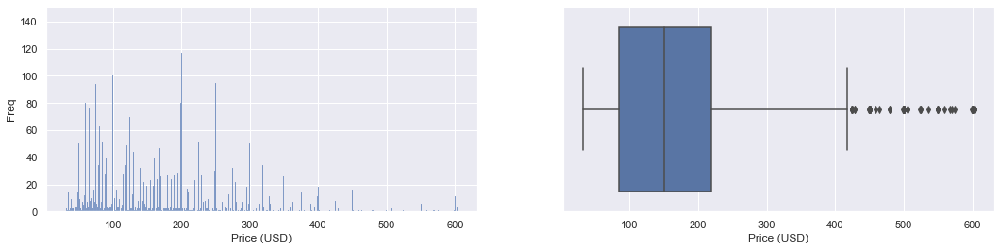

In [420]:
#Calculate range to exclude the outliers
x = boston_df3_listings.price
upper, lower = np.percentile(x, [1,99])
y = np.clip(x, upper, lower)
indexPersoncnt = boston_df3_listings[ boston_df3_listings['price'] != y].index
boston_df3_listings.drop(indexPersoncnt , inplace=True)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18,4))
sns.histplot(data=boston_df3_listings,x='price',discrete=True,ax=ax[0]) #multiple="stack",ax=ax[0]);
sns.boxplot(data=boston_df3_listings,x='price',ax=ax[1]);
ax[0].set_ylabel('Freq');
ax[0].set_xlabel('Price (USD)');
ax[1].set_xlabel('Price (USD)');

In [421]:
price = boston_df3_listings.groupby('neighbourhood_cleansed')['price'].mean().to_frame()

#### Function to estimate the revenue per listings

In [422]:
def estimate_revenue(reviews, listings, price):
    ''' Function to estimate the revenue per listings, assuming a 50% of reviews for each booking
        Params:
        reviews: int, number of reviews
        listings: int, total listings
        '''
    review_coeficient = 0.11   # Ratio between reviews and listings
    booking_coeficient = 2 # Assume 50% reviews for each booking
    revenue = 0
    
    if (listings == 0 and reviews == 0):
        revenue = 0                         # No listings, no bookings possible
    elif (reviews == 0 and listings > 0):   # There is listings but no reviews
        revenue = review_coeficient * listings * price
    elif (booking_coeficient*reviews <= listings):
        revenue = booking_coeficient * reviews * price
    
    else:                         # More reviews than listings, assume 100% booking
        revenue = listings * price

        
    return revenue
        
        
    
    

## Estimate the revenue per listing

In [423]:
df_revenue = boston_df3_listings.loc[(boston_df3_listings.number_of_reviews > 0) & (boston_df3_listings.availability_365 > 0),['id','price','number_of_reviews', 'availability_365','neighbourhood_cleansed','review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness',
                     'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value']].copy()


In [424]:
df_revenue['revenue'] = df_revenue.apply(lambda x: estimate_revenue(x['number_of_reviews'], x['availability_365'],x['price']), axis=1)

## who has more reviews
## who generates more revenues

In [425]:
totals_df_mean = df_revenue.groupby('neighbourhood_cleansed').mean()
totals_df_summary = df_revenue.groupby('neighbourhood_cleansed').sum()
totals_df_counts = df_revenue.groupby('neighbourhood_cleansed').count()

In [426]:
totals_df = totals_df_mean.copy()

In [427]:
totals_df['No_listings'] = totals_df_counts['price']

In [428]:
totals_df['Total_reviews'] = totals_df_summary['number_of_reviews']
totals_df['Total_availability'] = totals_df_summary['availability_365']
totals_df['Total_revenue'] = totals_df_summary['revenue']

In [429]:
totals_df['Revenue_per_availability'] = totals_df['Total_revenue']/totals_df['Total_availability']
totals_df['Revenue_per_reviews'] = totals_df['Total_revenue']/totals_df['Total_reviews']

In [430]:
totals_df.drop(columns =['id'],inplace=True)
totals_df

,price,number_of_reviews,availability_365,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,revenue,No_listings,Total_reviews,Total_availability,Total_revenue,Revenue_per_availability,Revenue_per_reviews
neighbourhood_cleansed,,,,,,,,,,,,,,,,,
Allston,111.622047,22.188976,199.787402,89.877538,9.250859,9.120700,9.556776,9.588272,9.138819,8.986842,3881.779528,127,2818,25373,492986.0,19.429551,174.941803
Back Bay,234.221698,18.919811,226.179245,90.803220,9.233981,9.261544,9.460954,9.460904,9.878313,9.007544,7587.933962,212,4011,47950,1608642.0,33.548321,401.057592
Bay Village,260.714286,16.285714,242.142857,92.285714,9.214286,9.142857,9.714286,9.785714,10.000000,9.071429,4771.571429,14,228,3390,66802.0,19.705605,292.991228
Beacon Hill,202.296296,28.659259,205.140741,92.918519,9.421805,9.294523,9.741262,9.711215,9.942306,9.189045,9163.674074,135,3869,27694,1237096.0,44.670181,319.745671
Brighton,122.109091,26.372727,229.790909,92.434148,9.464831,9.304568,9.707456,9.689599,9.308466,9.233248,5716.400000,110,2901,25277,628804.0,24.876528,216.754223
Charlestown,189.074627,28.492537,218.223881,93.686567,9.552239,9.402985,9.731343,9.835821,9.507463,9.358209,10533.492537,67,1909,14621,705744.0,48.269202,369.693033
Chinatown,248.189189,16.216216,185.972973,92.189189,9.324324,9.324324,9.459459,9.621622,9.297297,9.054054,5584.648649,37,600,6881,206632.0,30.029356,344.386667
Dorchester,91.980583,35.427184,260.509709,89.108064,9.273324,8.941727,9.566392,9.588164,8.610140,9.001413,5055.320388,206,7298,53665,1041396.0,19.405497,142.696081
Downtown,235.486726,21.734513,216.663717,91.122269,9.217496,9.279626,9.457009,9.419538,9.574324,9.009683,9583.433628,113,2456,24483,1082928.0,44.231834,440.931596


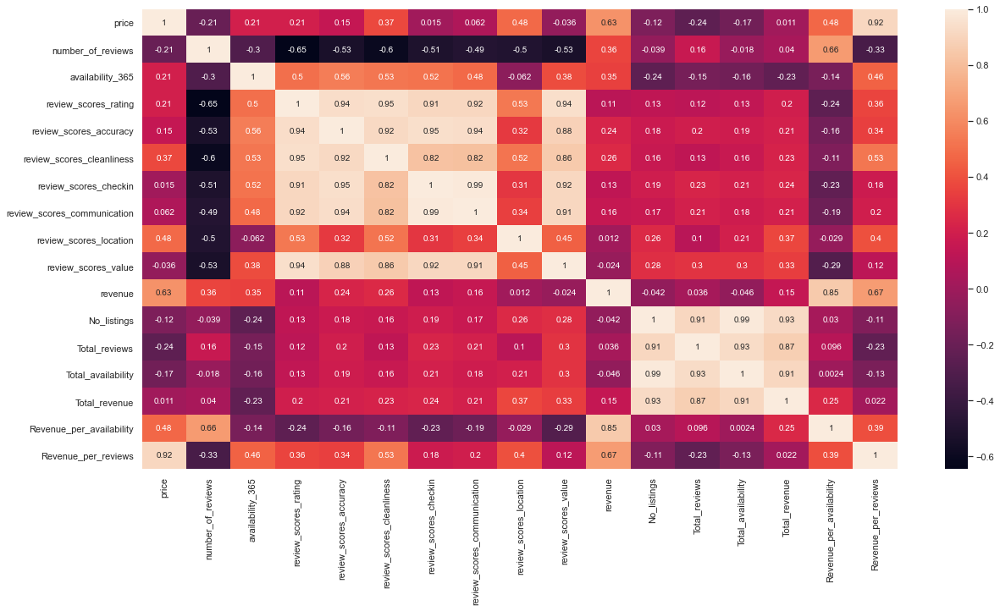

In [431]:
plt.figure(figsize=(20,10))
corr = totals_df.corr()
sns.heatmap(corr, annot=True);

In [432]:
#(boston_df3_listings.pivot(columns = "neighbourhood_cleansed", values = "price").plot.hist(bins = 30, stacked = True))

In [433]:
#sns.regplot(x='number_of_reviews',y='revenue',data=df_revenue)

In [434]:
#(df_revenue.pivot(columns = "neighbourhood_cleansed", values = "price").plot.hist(bins = 30, stacked = False, alpha = 0.8))

## Descriptive Stats to explore relations between features

### Correlation between price and some of the features

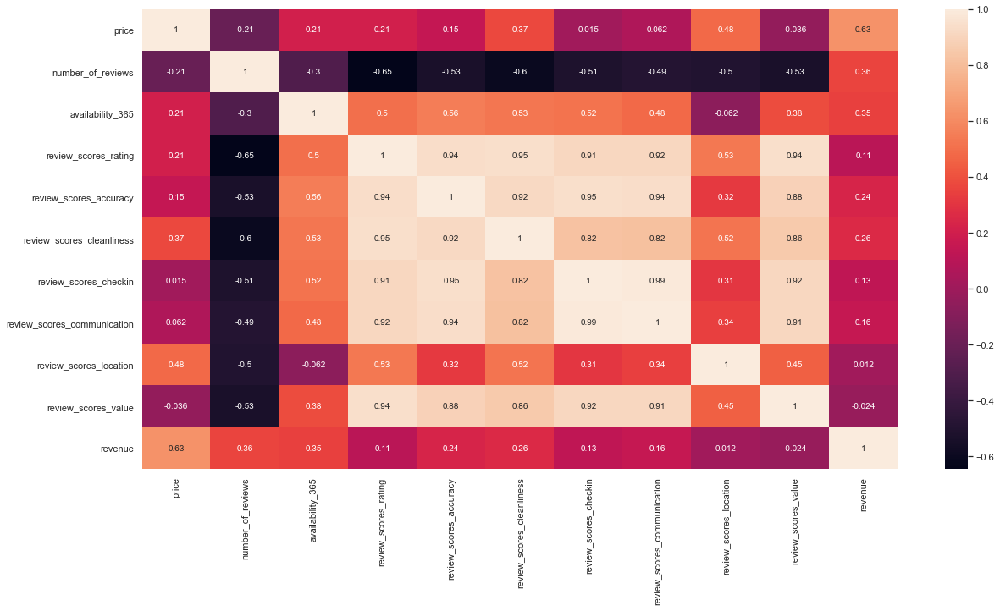

In [435]:
plt.figure(figsize=(20,10))
corr = totals_df_mean[['price', 'number_of_reviews', 'availability_365',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'revenue']].corr()
sns.heatmap(corr, annot=True);

### Average Revenue 

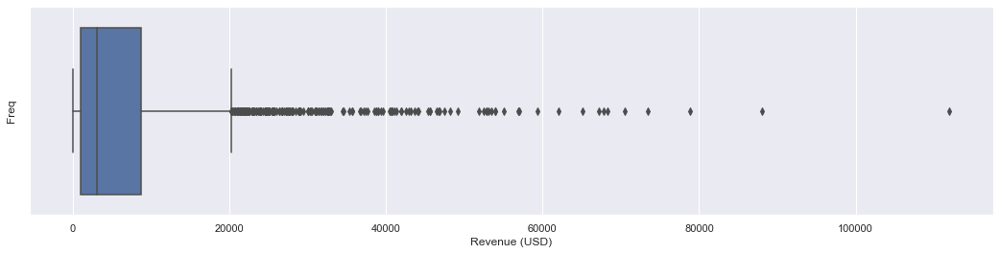

In [436]:
fig, ax = plt.subplots(figsize=(18,4))
sns.boxplot(data=df_revenue,x='revenue',ax=ax);
ax.set_ylabel('Freq');
ax.set_xlabel('Revenue (USD)');


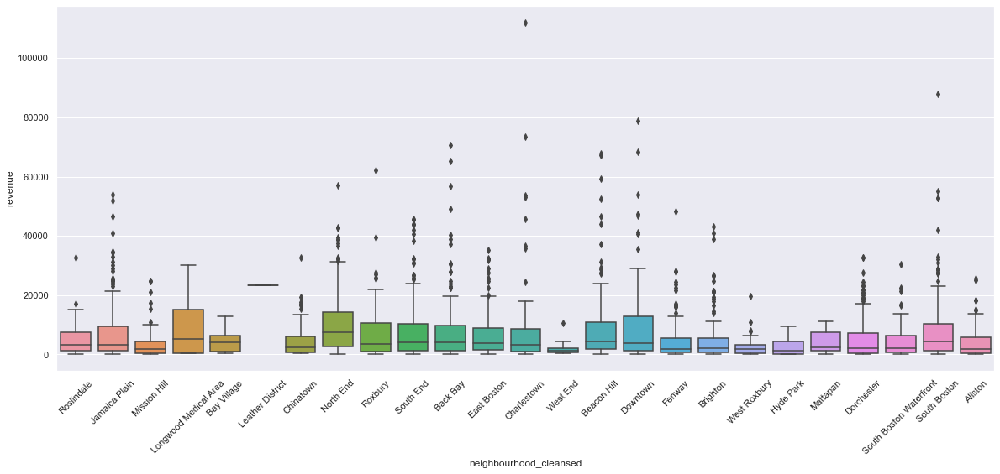

In [437]:
fig = plt.figure(figsize=(20,8))
sns.boxplot(x = "neighbourhood_cleansed", y = "revenue", data = df_revenue)
plt.xticks(rotation=45);

### Average Price

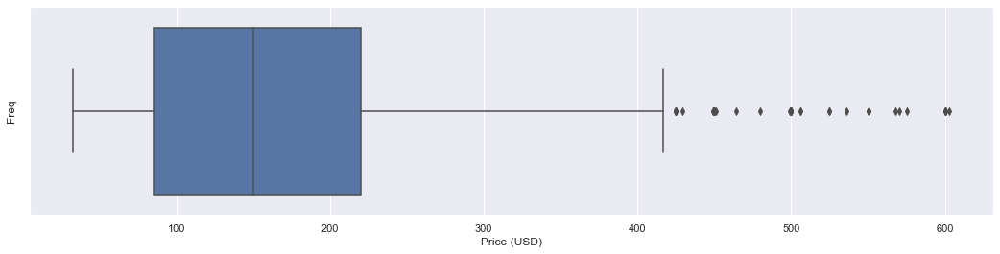

In [438]:
fig, ax = plt.subplots(figsize=(18,4))
sns.boxplot(data=df_revenue,x='price',ax=ax);
ax.set_ylabel('Freq');
ax.set_xlabel('Price (USD)');

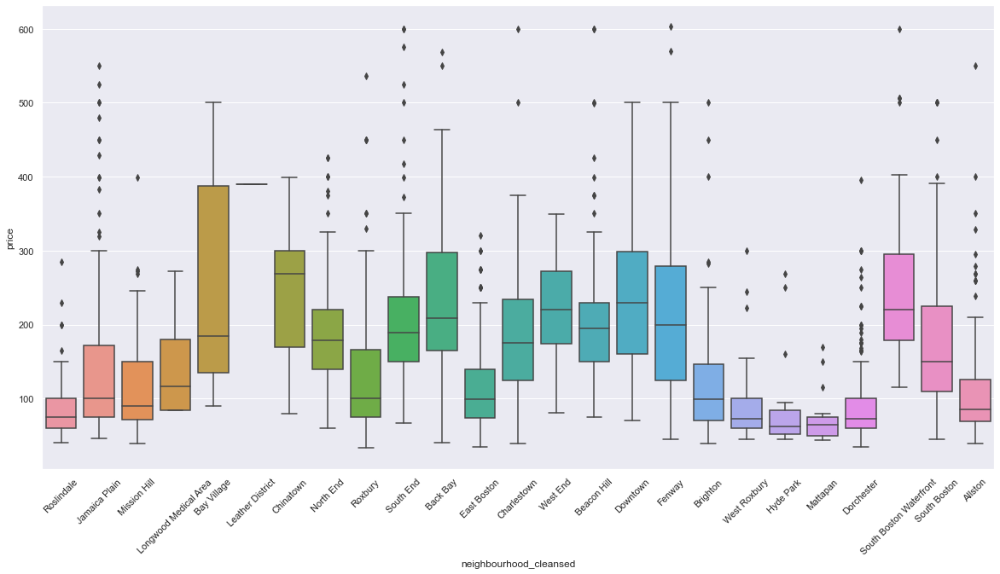

In [439]:
plt.subplots(nrows=1, ncols=1, figsize=(20,10)) 
sns.boxplot(x = "neighbourhood_cleansed", y = "price", data = df_revenue)
xticklabels = df_revenue['neighbourhood_cleansed']
plt.xticks(rotation=45);

/Users/rafaelmata357/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/rafaelmata357/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/rafaelmata357/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/rafaelmata357/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


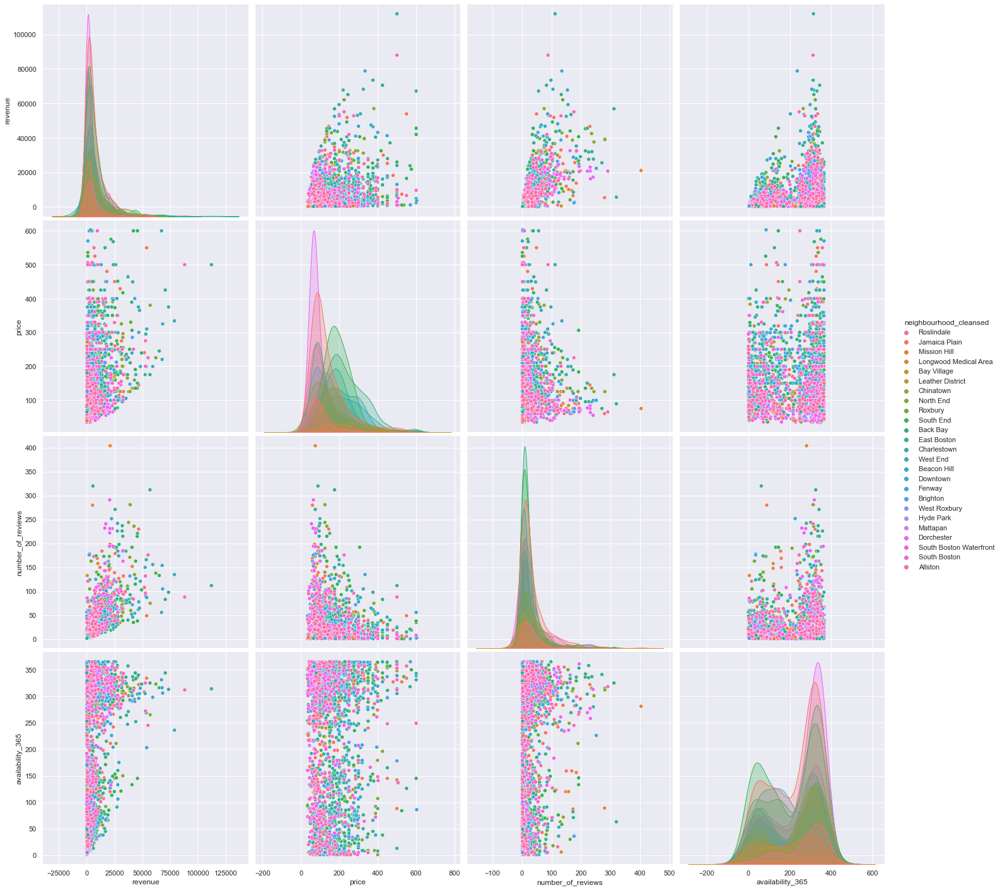

In [440]:
sns.set(rc={'figure.figsize':(20,15)})
sns.pairplot(df_revenue[['neighbourhood_cleansed','revenue','price','number_of_reviews','availability_365']],height=5,hue='neighbourhood_cleansed')

### MAP with the number of listings in the Boston Area

In [441]:
latitude = 42.35843
longitude = -71.05977

In [442]:
import folium
# create map and display it
boston_map = folium.Map(location=[latitude, longitude], zoom_start=12)

In [443]:
from folium import plugins

# let's start again with a clean copy of the map of San Francisco
boston_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
listings = plugins.MarkerCluster().add_to(boston_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(boston_df3_listings.latitude, boston_df3_listings.longitude, boston_df3_listings.neighbourhood_cleansed):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=folium.Popup(label),).add_to(listings)

# display map
boston_map

### Choropleth map with the mean price per Neighborbood

In [444]:
totals_df.reset_index(inplace=True)


In [445]:
boston_geo = r'neighbourhoods.geojson'

# create a numpy array of length 6 and has linear spacing from the minium total immigration to the maximum total immigration
threshold_scale = np.linspace(totals_df['price'].min(),
                              totals_df['price'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

# let Folium determine the scale.

boston_map = folium.Map(location = [latitude, longitude], zoom_start = 12,tiles='Mapbox Bright')
choropleth = folium.Choropleth(
    geo_data=boston_geo,
    data=totals_df,
    columns=['neighbourhood_cleansed', 'price'],
    key_on='feature.properties.neighbourhood',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average price in Boston Area',
    reset=True
).add_to(boston_map)

style_function = "font-size: 15px; font-weight: bold"
choropleth.geojson.add_child(folium.features.GeoJsonTooltip(['neighbourhood'], style=style_function, labels=False))

boston_map

In [446]:
boston_geo = r'neighbourhoods.geojson'

# create a numpy array of length 6 and has linear spacing from the minium total immigration to the maximum total immigration
threshold_scale = np.linspace(totals_df['revenue'].min(),
                              totals_df['revenue'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater 



# let Folium determine the scale.

boston_map = folium.Map(location = [latitude, longitude], zoom_start = 12,tiles='Mapbox Bright')
choropleth = folium.Choropleth(
    geo_data=boston_geo,
    data=totals_df,
    columns=['neighbourhood_cleansed', 'revenue'],
    key_on='feature.properties.neighbourhood',
    fill_color='BuGn', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average Airbnb revenue per year (2017) in Boston Area',
    reset=True, highlight=True
).add_to(boston_map)

style_function = "font-size: 15px; font-weight: bold"
choropleth.geojson.add_child(folium.features.GeoJsonTooltip(['neighbourhood'], style=style_function, labels=False))
boston_map

In [447]:
boston_geo = r'neighbourhoods.geojson'

# create a numpy array of length 6 and has linear spacing from the minium total immigration to the maximum total immigration
threshold_scale = np.linspace(totals_df['revenue'].min(),
                              totals_df['revenue'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater 



# let Folium determine the scale.

boston_map = folium.Map(location = [latitude, longitude], zoom_start = 12,tiles='Mapbox Bright')
choropleth = folium.Choropleth(
    geo_data=boston_geo,
    data=totals_df,
    columns=['neighbourhood_cleansed', 'Total_revenue'],
    key_on='feature.properties.neighbourhood',
    fill_color='YlGnBu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Estimated total Airbnb revenue per year (2017) in Boston Area',
    reset=True, highlight=True
).add_to(boston_map)

style_function = "font-size: 15px; font-weight: bold"
choropleth.geojson.add_child(folium.features.GeoJsonTooltip(['neighbourhood'], style=style_function, labels=False))
boston_map

In [448]:
# let Folium determine the scale.

boston_map = folium.Map(location = [latitude, longitude], zoom_start = 12,tiles='Mapbox Bright')
choropleth = folium.Choropleth(
    geo_data=boston_geo,
    data=totals_df,
    columns=['neighbourhood_cleansed', 'No_listings'],
    key_on='feature.properties.neighbourhood',
    fill_color='PuBuGn', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Estimated total Airbnb revenue per year (2017) in Boston Area',
    reset=True, highlight=True
).add_to(boston_map)

style_function = "font-size: 15px; font-weight: bold"
choropleth.geojson.add_child(folium.features.GeoJsonTooltip(['neighbourhood'], style=style_function, labels=False))
boston_map

In [478]:
# let Folium determine the scale.

boston_map = folium.Map(location = [latitude, longitude], zoom_start = 12,tiles='Mapbox Bright')
choropleth = folium.Choropleth(
    geo_data=boston_geo,
    data=totals_df,
    columns=['neighbourhood_cleansed', 'Total_availability'],
    key_on='feature.properties.neighbourhood',
    fill_color='YlGnBu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Total availability days for year (2017) in Boston Area',
    reset=True, highlight=True
).add_to(boston_map)

style_function = "font-size: 15px; font-weight: bold"
choropleth.geojson.add_child(folium.features.GeoJsonTooltip(['neighbourhood'], style=style_function, labels=False))
boston_map

In [450]:
# let Folium determine the scale.

boston_map = folium.Map(location = [latitude, longitude], zoom_start = 12,tiles='Mapbox Bright')
choropleth = folium.Choropleth(
    geo_data=boston_geo,
    data=totals_df,
    columns=['neighbourhood_cleansed', 'Revenue_per_reviews'],
    key_on='feature.properties.neighbourhood',
    fill_color='YlGnBu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Estimated total Airbnb revenue per year (2017) in Boston Area',
    reset=True, highlight=True
).add_to(boston_map)

style_function = "font-size: 15px; font-weight: bold"
choropleth.geojson.add_child(folium.features.GeoJsonTooltip(['neighbourhood'], style=style_function, labels=False))
boston_map

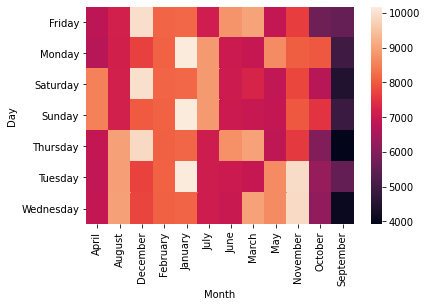

In [36]:
boston_df_calendar.groupby(['Month','Day'])['available'].sum().to_frame()
calendar_data =  pd.pivot_table(boston_df_calendar, values='available', index=['Day'], columns=['Month'], aggfunc=np.sum)
ax = sns.heatmap(calendar_data)

In [ ]:
df = df_pivot.reindex(df_pivot['Value'].sort_values(by=2012, ascending=False).index)
sort_index(axis='columns', level='month')

In [47]:
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
calendar_data.sort_index(axis='columns', level='Month',key=lambda x: x.str.lower())

TypeError: sort_index() got an unexpected keyword argument 'key'

In [50]:
help(calendar_data.sort_index)

Help on method sort_index in module pandas.core.frame:

sort_index(axis=0, level=None, ascending=True, inplace=False, kind='quicksort', na_position='last', sort_remaining=True, ignore_index: bool = False) method of pandas.core.frame.DataFrame instance
    Sort object by labels (along an axis).
    
    Parameters
    ----------
    axis : {0 or 'index', 1 or 'columns'}, default 0
        The axis along which to sort.  The value 0 identifies the rows,
        and 1 identifies the columns.
    level : int or level name or list of ints or list of level names
        If not None, sort on values in specified index level(s).
    ascending : bool, default True
        Sort ascending vs. descending.
    inplace : bool, default False
        If True, perform operation in-place.
    kind : {'quicksort', 'mergesort', 'heapsort'}, default 'quicksort'
        Choice of sorting algorithm. See also ndarray.np.sort for more
        information.  `mergesort` is the only stable algorithm. For
        Da

In [43]:
boston_df_calendar.dtypes

listing_id     int64
date          object
available      int64
Month         object
Year           int64
Day           object
dtype: object

# MODELING

### A mulitple linear regresion model will be used to predict the price

In [452]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import r2_score
from scipy import stats
from sklearn.ensemble import RandomForestRegressor


### Three  models  using different sub datasets:

- Complete dataset
- Dataset removing listings with 0 reviews and 0 availability
- Datasets that contains 0 listings or 0 availability

## Model #1 Complete dataset

In [453]:
y = boston_df3_listings['price'].values

In [454]:
X_df =  boston_df3_listings.drop(columns=['price','id','zipcode','neighbourhood_cleansed','host_listings_count','Iron', 'Kitchen', 'Pool', 'Shampoo', 'TV', 'Washer',
       'property_type_Apartment', 'property_type_Bed & Breakfast',
       'property_type_Boat', 'property_type_Camper/RV',
       'property_type_Condominium', 'property_type_Dorm',
       'property_type_Entire Floor', 'property_type_Guesthouse',
       'property_type_House',
       'availability_60', 'availability_90',
         'room_type_Shared room','cancellation_policy_strict','bed_type_Real Bed','property_type_Villa','"Wireless Internet"', 'Heating','"Free Parking on Street"', '"Other pet(s)"',
       '"Paid Parking Off Premises"', '"Washer / Dryer"',
       'property_type_Other', 'bed_type_Airbed', 'bed_type_Couch',
       'bed_type_Pull-out Sofa','"Laptop Friendly Workspace"'])

In [455]:
X = X_df.values

### Standarize all the features using MinMaxScaler and split the dataset in traninning and tests sets

In [456]:
#X= preprocessing.StandardScaler().fit(X).transform(X)
X= preprocessing.MinMaxScaler().fit(X).transform(X)
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (2813, 66) (2813,)
Test set: (704, 66) (704,)


### Linear regression Model

In [457]:
regr = linear_model.LinearRegression()
regr.fit (X_train, y_train)
regr.intercept_

-89.41545826120426

In [458]:
coefs = list(zip(regr.coef_, X_df))
coefs

[(16.2686247340992, 'host_response_rate'),
 (3.3993225410644565, 'host_acceptance_rate'),
 (-43.84637436467298, 'host_total_listings_count'),
 (18.25132008687599, 'host_is_superhost'),
 (34.45480583285332, 'availability_30'),
 (4.2451966114017665, 'availability_365'),
 (66.71767138232772, 'latitude'),
 (42.04154186331516, 'longitude'),
 (91.01114351298186, 'bathrooms'),
 (167.34637387960214, 'bedrooms'),
 (109.299754630381, 'beds'),
 (121.89448135749443, 'guests_included'),
 (-6.590842360191788, 'extra_people'),
 (-55.226192816066245, 'number_of_reviews'),
 (46.90076248064669, 'review_scores_rating'),
 (-21.22342838637475, 'review_scores_accuracy'),
 (19.846791113929875, 'review_scores_cleanliness'),
 (-6.575671692622411, 'review_scores_checkin'),
 (-56.996661674517355, 'review_scores_communication'),
 (62.34166281213584, 'review_scores_location'),
 (-52.412835162190206, 'review_scores_value'),
 (-59.418110726499286, 'reviews_per_month'),
 (-1.3111126714620625, 'bus-stop'),
 (8.7994484

### Calculate metrics to evaluate the model performance

In [459]:
y_hat= regr.predict(X_test)
print("Mean absolute error: %.2f" % np.mean(np.absolute(y_hat - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_hat - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_hat , y_test) )
print('Variance score: %.2f' % regr.score(X_test, y_test))
print('Pearson Coef:',stats.pearsonr(y_test,y_hat)[0])
print('p-value:',stats.pearsonr(y_test,y_hat)[1])

Mean absolute error: 46.16
Residual sum of squares (MSE): 4639.22
R2-score: 0.31
Variance score: 0.58
Pearson Coef: 0.7605725750260537
p-value: 8.158214977001869e-134


### Model using RandomForest

In [460]:
regr = RandomForestRegressor(max_depth=14, random_state=0,criterion = 'mse', n_estimators = 100)
regr.fit(X_train, y_train)
y_hat= regr.predict(X_test)

print("Mean absolute error: %.2f" % np.mean(np.absolute(y_hat - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_hat - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_hat , y_test) )
print('Variance score: %.2f' % regr.score(X_test, y_test))

Mean absolute error: 40.07
Residual sum of squares (MSE): 3628.64
R2-score: 0.47
Variance score: 0.67


### CASE #2 Removing the listings with 0 reviews or 0 availability

In [461]:
df_no_cero_rev = boston_df3_listings[(boston_df3_listings.number_of_reviews > 0)  & (boston_df3_listings.availability_365 > 0)]

In [462]:
y = df_no_cero_rev['price'].values

In [463]:
X_df = df_no_cero_rev.drop(columns=['price','id','zipcode','neighbourhood_cleansed','host_listings_count','Iron', 'Kitchen', 'Pool', 'Shampoo', 'TV', 'Washer',
       'property_type_Apartment', 'property_type_Bed & Breakfast',
       'property_type_Boat', 'property_type_Camper/RV',
       'property_type_Condominium', 'property_type_Dorm',
       'property_type_Entire Floor', 'property_type_Guesthouse',
       'property_type_House',
       'availability_60', 'availability_90',
         'room_type_Shared room','cancellation_policy_strict','bed_type_Real Bed','property_type_Villa','"Wireless Internet"', 'Heating','"Free Parking on Street"', '"Other pet(s)"',
       '"Paid Parking Off Premises"', '"Washer / Dryer"',
       'property_type_Other', 'bed_type_Airbed', 'bed_type_Couch',
       'bed_type_Pull-out Sofa','"Laptop Friendly Workspace"'])

In [464]:
X = X_df.values

### Standarize all the features using MinMaxScaler and split the dataset in traninning and tests sets

In [465]:
#X= preprocessing.StandardScaler().fit(X).transform(X)
X= preprocessing.MinMaxScaler().fit(X).transform(X)
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (1884, 66) (1884,)
Test set: (472, 66) (472,)


### Linear regression Model

In [466]:
regr = linear_model.LinearRegression()
regr.fit (X_train, y_train)
regr.intercept_

-167.40022784531146

In [467]:
coefs = list(zip(regr.coef_, X_df))
coefs

[(19.737036797707173, 'host_response_rate'),
 (12.988057322054289, 'host_acceptance_rate'),
 (-16.354862755325364, 'host_total_listings_count'),
 (12.540453263672742, 'host_is_superhost'),
 (37.154718469974064, 'availability_30'),
 (3.7233022834441343, 'availability_365'),
 (63.05704034523829, 'latitude'),
 (27.569480553055186, 'longitude'),
 (141.1657261699392, 'bathrooms'),
 (173.95469760893775, 'bedrooms'),
 (73.10549057255845, 'beds'),
 (84.39878619263871, 'guests_included'),
 (-25.266426829397975, 'extra_people'),
 (-44.15921975118123, 'number_of_reviews'),
 (46.31174846083831, 'review_scores_rating'),
 (19.41303674378944, 'review_scores_accuracy'),
 (13.957340211939432, 'review_scores_cleanliness'),
 (-4.8795505929279255, 'review_scores_checkin'),
 (-17.139802980868453, 'review_scores_communication'),
 (64.87311804919257, 'review_scores_location'),
 (-59.48318357257061, 'review_scores_value'),
 (-86.89334332804333, 'reviews_per_month'),
 (-1.6267328774839633, 'bus-stop'),
 (1.081

### Calculate metrics to evaluate the model performance

In [469]:
y_hatL= regr.predict(X_test)
print("Mean absolute error: %.2f" % np.mean(np.absolute(y_hatL - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_hatL - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_hatL , y_test) )
print('Variance score: %.2f' % regr.score(X_test, y_test))
print('Pearson Coef:',stats.pearsonr(y_test,y_hatL)[0])
print('p-value:',stats.pearsonr(y_test,y_hatL)[1])

Mean absolute error: 40.23
Residual sum of squares (MSE): 3195.38
R2-score: 0.55
Variance score: 0.69
Pearson Coef: 0.82881795377137
p-value: 1.3168151250121475e-120


### Model using RandomForest

In [470]:
regr = RandomForestRegressor(max_depth=14, random_state=0,criterion = 'mse', n_estimators = 100)


#from sklearn import decomposition

#pca = decomposition.PCA(n_components=40)
#pca.fit(X)
#X = pca.transform(X)

X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)


regr.fit(X_train, y_train)
y_hat= regr.predict(X_test)

print("Mean absolute error: %.2f" % np.mean(np.absolute(y_hat - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_hat - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_hat , y_test) )
print('Variance score: %.2f' % regr.score(X_test, y_test))
print('Pearson Coef:',stats.pearsonr(y_test,y_hat)[0])
print('p-value:',stats.pearsonr(y_test,y_hat)[1])

Train set: (1884, 66) (1884,)
Test set: (472, 66) (472,)
Mean absolute error: 34.88
Residual sum of squares (MSE): 2587.91
R2-score: 0.66
Variance score: 0.75
Pearson Coef: 0.8643175159651085
p-value: 2.2076859147064667e-142


In [471]:
y_hat= regr.predict(X_train)
print("R2-score: %.2f" % r2_score(y_hat , y_train) )

R2-score: 0.94


In [472]:
from sklearn.linear_model import Ridge

clf = Ridge(alpha=6.0,solver='svd',tol=1e-6)
clf.fit(X_train, y_train)
y_hat= clf.predict(X_test)

print("Mean absolute error: %.2f" % np.mean(np.absolute(y_hat - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_hat - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_hat , y_test) )
print('Variance score: %.2f' % regr.score(X_test, y_test))

Mean absolute error: 39.67
Residual sum of squares (MSE): 3193.89
R2-score: 0.51
Variance score: 0.75


In [473]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.kernel_ridge import KernelRidge

svr = GridSearchCV(SVR(kernel='rbf', gamma=0.1),
                   param_grid={"C": [1e0, 1e1, 1e2, 1e3],
                               "gamma": np.logspace(-2, 2, 5)})

kr = GridSearchCV(KernelRidge(kernel='rbf', gamma=0.1),
                  param_grid={"alpha": [1e0, 0.1, 1e-2, 1e-3],
                              "gamma": np.logspace(-2, 2, 5)})


svr.fit(X_train, y_train)

y_hat= svr.predict(X_test)

print("Mean absolute error: %.2f" % np.mean(np.absolute(y_hat - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_hat - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_hat , y_test) )
print('Variance score: %.2f' % regr.score(X_test, y_test))


Mean absolute error: 38.06
Residual sum of squares (MSE): 3161.96
R2-score: 0.48
Variance score: 0.75


In [474]:
svr_rbf = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
svr_lin = SVR(kernel='linear', C=100, gamma='auto')
svr_poly = SVR(kernel='poly', C=100, gamma='auto', degree=3, epsilon=.1,coef0=1)

In [475]:
svr_poly.fit(X_train, y_train)
y_hat= svr_poly.predict(X_test)

print("Mean absolute error: %.2f" % np.mean(np.absolute(y_hat - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_hat - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_hat , y_test) )
print('Variance score: %.2f' % regr.score(X_test, y_test))

Mean absolute error: 38.90
Residual sum of squares (MSE): 3359.97
R2-score: 0.40
Variance score: 0.75


In [476]:
kr.fit(X_train, y_train)

y_hat= kr.predict(X_test)

print("Mean absolute error: %.2f" % np.mean(np.absolute(y_hat - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_hat - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_hat , y_test) )
print('Variance score: %.2f' % regr.score(X_test, y_test))

Mean absolute error: 38.98
Residual sum of squares (MSE): 2984.73
R2-score: 0.60
Variance score: 0.75


### Case #3 Model only the cases with 0 reviews or 0 availability

In [236]:
df_cero_reviews = boston_df3_listings[(boston_df3_listings.number_of_reviews == 0) | (boston_df3_listings.availability_365 == 0)]

In [238]:
y = df_cero_reviews['price'].values

In [239]:
X_df = df_cero_reviews.drop(columns=['price','id','zipcode','neighbourhood_cleansed','host_listings_count','Iron', 'Kitchen', 'Pool', 'Shampoo', 'TV', 'Washer',
       'property_type_Apartment', 'property_type_Bed & Breakfast',
       'property_type_Boat', 'property_type_Camper/RV',
       'property_type_Condominium', 'property_type_Dorm',
       'property_type_Entire Floor', 'property_type_Guesthouse',
       'property_type_House',
       'availability_60', 'availability_90',
         'room_type_Shared room','cancellation_policy_strict','bed_type_Real Bed','property_type_Villa','"Wireless Internet"', 'Heating','"Free Parking on Street"', '"Other pet(s)"',
       '"Paid Parking Off Premises"', '"Washer / Dryer"',
       'property_type_Other', 'bed_type_Airbed', 'bed_type_Couch',
       'bed_type_Pull-out Sofa','"Laptop Friendly Workspace"'])

In [240]:
X = X_df.values

### Standarize all the features using MinMaxScaler and split the dataset in traninning and tests sets

In [241]:
#X= preprocessing.StandardScaler().fit(X).transform(X)
X= preprocessing.MinMaxScaler().fit(X).transform(X)
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (928, 66) (928,)
Test set: (233, 66) (233,)


### Linear Model

In [242]:
regr = linear_model.LinearRegression()
regr.fit (X_train, y_train)
regr.intercept_

-33.4517574061054

In [243]:
coefs = list(zip(regr.coef_, X_df))
coefs

[(-3.0608007287769725, 'host_response_rate'),
 (7.538351428319768, 'host_acceptance_rate'),
 (-74.54239796285076, 'host_total_listings_count'),
 (24.432100854328375, 'host_is_superhost'),
 (41.17693302343891, 'availability_30'),
 (-31.366608639832208, 'availability_365'),
 (72.7949215501149, 'latitude'),
 (63.046677296703564, 'longitude'),
 (36.61846282937529, 'bathrooms'),
 (133.69703212971126, 'bedrooms'),
 (227.1248101632294, 'beds'),
 (0.2653394128416018, 'guests_included'),
 (33.0354043730834, 'extra_people'),
 (-27.705695845209434, 'number_of_reviews'),
 (22.249022238261137, 'review_scores_rating'),
 (-83.71146858076655, 'review_scores_accuracy'),
 (27.233189033657137, 'review_scores_cleanliness'),
 (15.586048227984271, 'review_scores_checkin'),
 (-43.53357168557061, 'review_scores_communication'),
 (51.930279348013286, 'review_scores_location'),
 (-17.5386395105296, 'review_scores_value'),
 (-31.410634579401826, 'reviews_per_month'),
 (-2.4059346458090687, 'bus-stop'),
 (15.7281

### Calculate Performance Metrics

In [244]:
y_hat= regr.predict(X_test)
print("Mean absolute error: %.2f" % np.mean(np.absolute(y_hat - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_hat - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_hat , y_test) )
print('Variance score: %.2f' % regr.score(X_test, y_test))
print('Pearson Coef:',stats.pearsonr(y_test,y_hat)[0])
print('p-value:',stats.pearsonr(y_test,y_hat)[1])

Mean absolute error: 54.77
Residual sum of squares (MSE): 6282.26
R2-score: -0.05
Variance score: 0.41
Pearson Coef: 0.6455352814226125
p-value: 7.350846913645057e-29


### Random Forest

In [245]:
regr = RandomForestRegressor(max_depth=14, random_state=0,criterion = 'mse', n_estimators = 100)
regr.fit(X_train, y_train)
y_hat= regr.predict(X_test)

print("Mean absolute error: %.2f" % np.mean(np.absolute(y_hat - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_hat - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_hat , y_test) )
print('Variance score: %.2f' % regr.score(X_test, y_test))

Mean absolute error: 49.70
Residual sum of squares (MSE): 6031.51
R2-score: -0.06
Variance score: 0.43


In [247]:
from sklearn.linear_model import Ridge

clf = Ridge(alpha=1.0)
clf.fit(X_train, y_train)
y_hat= clf.predict(X_test)

print("Mean absolute error: %.2f" % np.mean(np.absolute(y_hat - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_hat - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_hat , y_test) )
print('Variance score: %.2f' % regr.score(X_test, y_test))

Mean absolute error: 54.29
Residual sum of squares (MSE): 6238.99
R2-score: -0.09
Variance score: 0.43


(0.6455352814226125, 7.350846913645057e-29)


<AxesSubplot:>

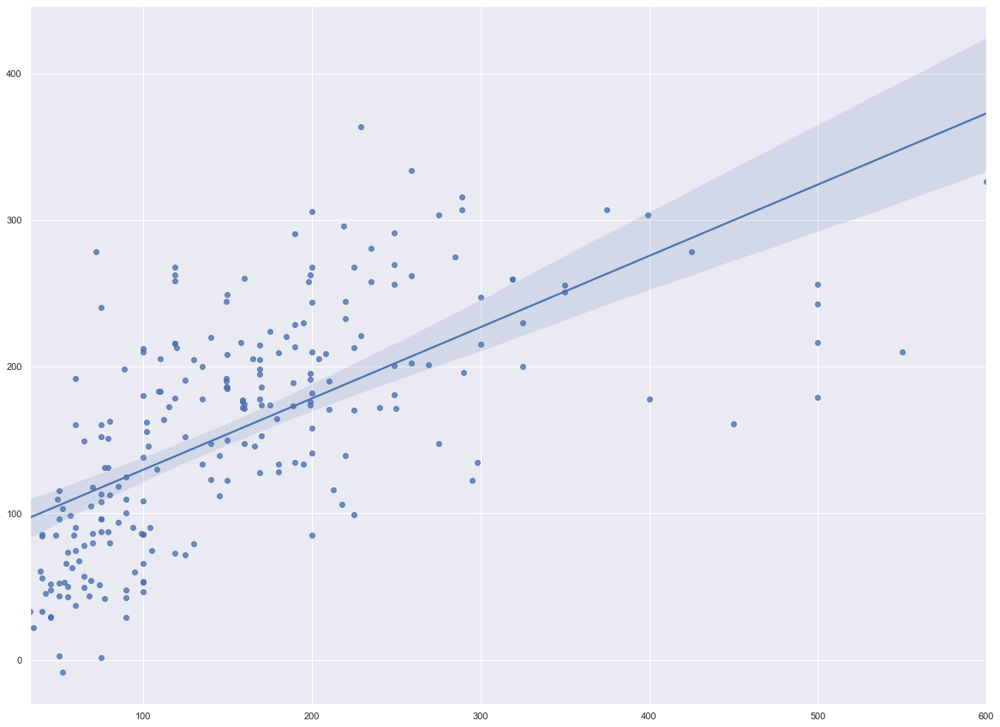

In [716]:


sns.color_palette("tab10")
sns.color_palette("rocket", as_cmap=True)
sns.regplot(x=y_test,y=y_hat)